<a href="https://colab.research.google.com/github/milipaget/PASA-2023/blob/main/TP_2_PASA.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Trabajo Práctico N°2 - Filtrado lineal óptimo**
> ### Paget, Milagros 61449
> ### Voss, María de Guadalupe 61583

El objetivo de este trabajo es modelar la respuesta al impulso de un sistema parlante-habitación-micrófono.

In [2]:
#Se importan las bibliotecas necesarias.
import numpy as np
import scipy as scipy
import matplotlib.pyplot as plt
from IPython.display import Audio
from scipy.io import wavfile
from scipy.linalg import solve_toeplitz
import scipy.signal as signal

## Excitaciones grabadas y generadas:
1. Señal de voz
2. Señal de música
3. Señal rectangular
4. Barrido lineal de frecuencia
5. Barrido exponencial de frecuencia
6. Ruido blanco gaussiano

In [3]:
#Configuración básica de las señales que se generarán
fs = 48000 #Frecuencia de muestreo
duration = 10 #En segundos
f0 = 20
f1 = 20000
amplitude = 1
numSamples = int(duration * fs)
time = np.linspace(0, duration, numSamples, endpoint=False)

### Generación de señales:

Se generarán a continuación las señales especificadas anteriormente.

In [4]:
#Señal rectangular
f = 100

rectangularSignal = np.where(np.sin(2 * np.pi * f * time) >= 0, 1, -1)

# Convertir la señal a valores enteros de 16 bits (formato WAV)
rectangularSignal = np.int16(rectangularSignal * 32767)

# Guardar la señal como archivo WAV (opcional)
outputFilename = "señal rectangular OG.wav"
wavfile.write(outputFilename, fs, rectangularSignal)

audio = Audio("señal rectangular OG.wav")
display(audio)


In [5]:
#Barrido lineal de frecuencia
k = (f1-f0)/duration
signalLinearSweep = np.sin(2 * np.pi * f0 * time + 2 * np.pi * k * (time**2)/2)
signalLinearSweep = np.int16(signalLinearSweep * 32767)

outputFilename = "barrido lineal OG.wav"
wavfile.write(outputFilename, fs, signalLinearSweep)

audio = Audio("barrido lineal OG.wav")
display(audio)


In [6]:
#Barrido exponencial de frecuencia
k = (f1/f0)**(1/duration)
signalExpSweep = np.sin(2 * np.pi * f0 * (k**(time)-1)/(np.log(k)))
signalExpSweep = np.int16(signalExpSweep * 32767)

outputFilename = "barrido exponencial OG.wav"
wavfile.write(outputFilename, fs, signalExpSweep)

audio = Audio("barrido exponencial OG.wav")
display(audio)

In [7]:
#Ruido blanco gaussiano
whiteNoise = np.random.normal(0, 1, numSamples)  #Media cero y variación 1
whiteNoise = amplitude * whiteNoise

whiteNoise = np.int16(whiteNoise * 32767)

outputFilename = "ruido blanco OG.wav"
wavfile.write(outputFilename, fs, whiteNoise)

audio = Audio("ruido blanco OG.wav")
display(audio)


In [8]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [9]:
#Se utiliza esta función para pasara de audio estéreo a mono.
def audioToMono(audio):
  if audio.ndim == 2:
      audio = np.mean(audio, axis=1)
  else:
      audio = audio

  return audio

In [10]:
#Se cargan las dos señales de audio (original y la reproducción en la sala) ppara sincronizarlas
def sincronizeAudios (audioOriginal, pathNew):
  fsReproducido, audioReproducido = wavfile.read(pathNew)

  audioReproducido = audioToMono(audioReproducido)

  # Se agregan ceros para que tengan el mismo largo
  if(len(audioOriginal)>len(audioReproducido)):
    audioReproducido = np.concatenate((audioReproducido, np.zeros(len(audioOriginal)- len(audioReproducido))))
  else:
    audioOriginal = np.concatenate((audioOriginal, np.zeros(len(audioReproducido)- len(audioOriginal))))

  # Se calcula la correlación cruzada entre las dos señales
  correlation = signal.correlate(audioOriginal, audioReproducido, mode='full')

  lag = (np.argmax(correlation)-len(audioReproducido))
  lagSeconds = lag/fs

  # Se sincroniza el audio reproducido
  if lag > 0:
      audioReproducidoSincronizado = np.pad(audioReproducido, (lag, 0), 'constant')
      audioReproducidoSincronizado = audioReproducidoSincronizado[:len(audioOriginal)]
  elif lag < 0:
      audioReproducidoSincronizado = audioReproducido[-lag: ((duration*fsReproducido)-lag)]
  else:
      audioReproducidoSincronizado = audioReproducido
  return audioReproducidoSincronizado


### Carga de audios

In [11]:
#Señales que utilizaremos a lo largo de todo el notebook
fs, rectangularOG = wavfile.read('/content/drive/My Drive/TP2 PASA/señal rectangular OG.wav')
rectangularOG = audioToMono(rectangularOG)
rectangularOG = ((rectangularOG - np.mean(rectangularOG))/np.max(rectangularOG))
rectangularSala = sincronizeAudios(rectangularOG, '/content/drive/My Drive/TP2 PASA/señal rectangular.wav')
rectangularSala = ((rectangularSala - np.mean(rectangularSala))/np.max(rectangularSala))
fs, vozOG = wavfile.read('/content/drive/My Drive/TP2 PASA/señal de voz OG.wav')
vozOG = audioToMono(vozOG)[:fs*duration]
vozOG = ((vozOG - np.mean(vozOG))/np.max(vozOG))
vozSala = sincronizeAudios(vozOG, '/content/drive/My Drive/TP2 PASA/señal de voz.wav')
vozSala = ((vozSala - np.mean(vozSala))/np.max(vozSala))
fs, musicaOG = wavfile.read('/content/drive/My Drive/TP2 PASA/señal de música OG.wav')
musicaOG = audioToMono(musicaOG)[:fs*duration]
musicaOG = ((musicaOG - np.mean(musicaOG))/np.max(musicaOG))
musicaSala = sincronizeAudios(musicaOG, '/content/drive/My Drive/TP2 PASA/señal de música.wav')
musicaSala = ((musicaSala - np.mean(musicaSala))/np.max(musicaSala))
fs, barridoLinealOG = wavfile.read('/content/drive/My Drive/TP2 PASA/barrido lineal OG.wav')
barridoLinealOG = audioToMono(barridoLinealOG)
barridoLinealOG = ((barridoLinealOG - np.mean(barridoLinealOG))/np.max(barridoLinealOG))
barridoLinealSala = sincronizeAudios(barridoLinealOG, '/content/drive/My Drive/TP2 PASA/barrido lineal.wav')
barridoLinealSala = ((barridoLinealSala - np.mean(barridoLinealSala))/np.max(barridoLinealSala))
fs, barridoExpOG = wavfile.read('/content/drive/My Drive/TP2 PASA/barrido exponencial OG.wav')
barridoExpOG = audioToMono(barridoExpOG)
barridoExpOG = ((barridoExpOG - np.mean(barridoExpOG))/np.max(barridoExpOG))
barridoExpSala = sincronizeAudios(barridoExpOG, '/content/drive/My Drive/TP2 PASA/barrido exponencial.wav')
barridoExpSala = ((barridoExpSala - np.mean(barridoExpSala))/np.max(barridoExpSala))
fs, ruidoBlancoOG = wavfile.read('/content/drive/My Drive/TP2 PASA/ruido blanco OG.wav')
ruidoBlancoOG = audioToMono(ruidoBlancoOG)
ruidoBlancoOG = ((ruidoBlancoOG - np.mean(ruidoBlancoOG))/np.max(ruidoBlancoOG))
ruidoBlancoSala = sincronizeAudios(ruidoBlancoOG, '/content/drive/My Drive/TP2 PASA/ruido blanco.wav')
ruidoBlancoSala = ((ruidoBlancoSala - np.mean(ruidoBlancoSala))/np.max(ruidoBlancoSala))


In [12]:
#Para reproducir los audios recortados
rectangularSalaAud = np.int16(rectangularSala/(np.max(abs(rectangularSala)))* 32767)

outputFilename = "prueba.wav"
wavfile.write(outputFilename, fs, rectangularSalaAud)

audio = Audio("prueba.wav")
display(audio)

In [13]:
vozSalaAud = np.int16(vozSala/(np.max(abs(rectangularSala)))* 32767)

outputFilename = "prueba.wav"
wavfile.write(outputFilename, fs, vozSalaAud)

audio = Audio("prueba.wav")
display(audio)

## Espectro de las diferentes excitaciones
Para determinar cuál de las excitaciones dará la mejor estimación de h(n), se analizará el espectro de potencia de cada excitación.


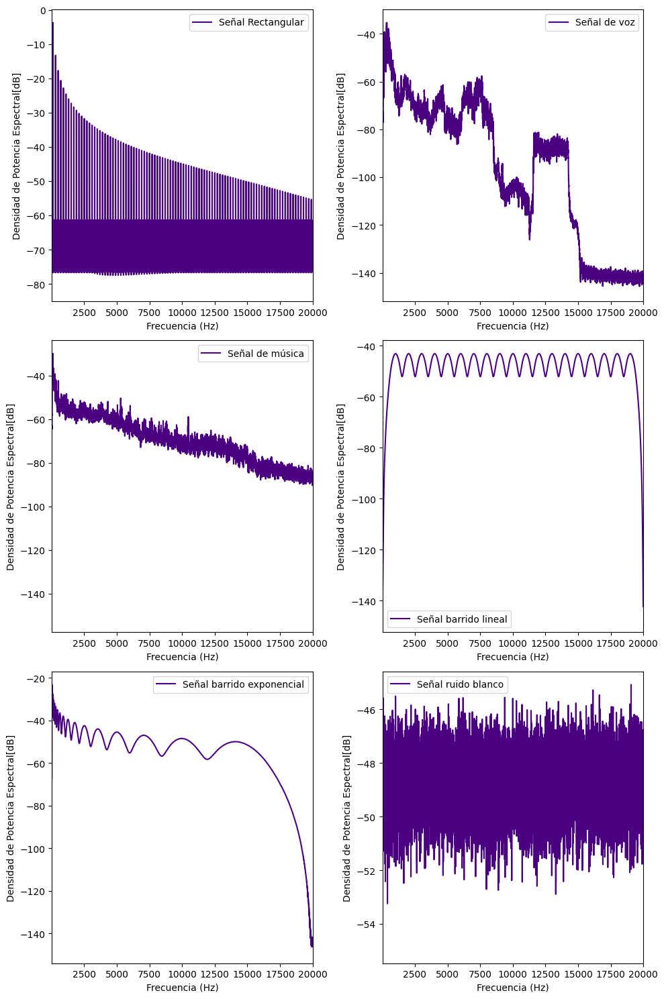

In [14]:
fig2,axs = plt.subplots(3,2,figsize=(10,15))
datasetsOG = [rectangularOG, vozOG, musicaOG, barridoLinealOG, barridoExpOG, ruidoBlancoOG]
for i, ax in enumerate(axs.flatten()):
  frequenciesOG, periodogramOG = signal.welch(datasetsOG[i], fs, window='parzen', nperseg = len(datasetsOG[i])/10)
  end_idxOG = int(len(frequenciesOG)/2)
  if(i == 0):
    label = 'Señal Rectangular'
  if(i == 1):
    label = 'Señal de voz'
  if(i == 2):
    label = 'Señal de música'
  if(i == 3):
    label = 'Señal barrido lineal'
  if(i == 4):
    label = 'Señal barrido exponencial'
  if(i == 5):
    label = 'Señal ruido blanco'
  ax.plot(frequenciesOG, 10*np.log10(periodogramOG), label=label, color='indigo')
  ax.set_xlabel('Frecuencia (Hz)')
  ax.set_ylabel('Densidad de Potencia Espectral[dB]')
  ax.legend()
  ax.set_xlim(20,20000)

plt.tight_layout()
plt.show()

A partir de los gráficos de espectros de potencias anteriores se puede predecir que la excitación que va a proporcionar una mejor estimación será el barrido lineal de frecuencia. Esto se debe a que su espectro abarca un mayor rango de frecuencias y resulta bien distribuido a lo largo de las mismas. Al contar con estos atributos, la caracterización del sistema habitación-micrófono-parlante debería ser más fiel a la realidad.



## Valor óptimo de M para barrido lineal de frecuencia
Con el objetivo de encontrar el valor óptimo de M se analizará el error cuadrático medio (MSE) en función de M con el barrido lineal en frecuencia. Se utilizarpa aquel M que minimice el valor del MSE.

Con el objetivo de reducir el costo computacional resolver el sistema se utiliza el algoritmo de Levinson-Durbin. Se utiliza la función solve_toeplitz que utiliza este algoritmo.

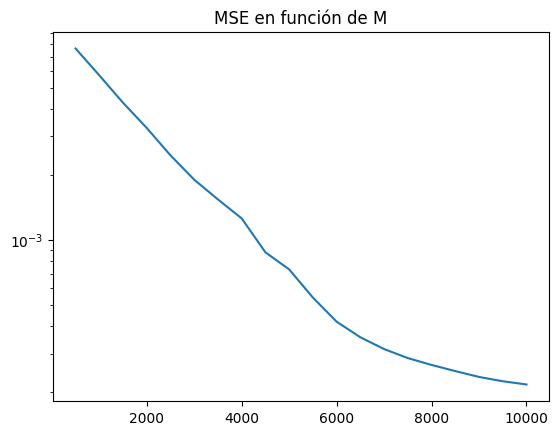

In [15]:
excitacion = ((barridoLinealOG - np.mean(barridoLinealOG))/np.max(barridoLinealOG))
grabacion = ((barridoLinealSala - np.mean(barridoLinealSala))/np.max(barridoLinealSala))

# Definir un rango de valores de M a evaluar
rango_M = range(500, 20500, 500)

# Inicializar una lista para almacenar los valores de MSE para cada M
Jo_values = []

R = signal.correlate(excitacion, excitacion, mode='full')[len(excitacion)-1:]/len(excitacion)
p = signal.correlate(grabacion, excitacion, mode='full')[len(excitacion)-1:]/len(excitacion)

# Loop para calcular el MSE para cada valor de M
for M in rango_M:
    RAux = R[:M]
    pAux = p[:M]
    w = solve_toeplitz(RAux, pAux, check_finite=True)

    estimatedSignal = signal.convolve(excitacion, w, mode='same')

    # Calcular el MMSE entre la señal filtrada estimada y la grabación
    Jo = np.var(grabacion) - pAux.dot(w)

    # Registrar el valor de MMSE para este valor de M
    Jo_values.append(Jo)
    if(len(Jo_values) != 1):
      if(np.abs(Jo_values[-1] - Jo_values[-2]) < 1e-5):
        break

# Encontrar el valor óptimo de M que minimiza el MMSE
optimal_M = rango_M[np.argmin(Jo_values)]

plt.plot(rango_M[:len(Jo_values)], Jo_values)
plt.title('MSE en función de M')
plt.yscale('log')


Al realizar el análisis una primera vez se concluyó que el MSE siempre disminuye con un valor de M mayor, por lo que el menor valor de MSE se obtendría con M=N. Sin embargo, este cálculo resultaría muy costoso computacionalmente. Por otra parte, se observó que a partir de un cierto valor de M el MSE se estabiliza, por lo que al aumentar más M no proporcionaría una mejora significativa.

 Por esta razón se optó por considerar un ΔJo para poder obtener un buen resultado de MSE cuidando el costo computacional. Se notó que el MSE se estabiliza en un valor del orden de 1e-4 con pequeñas variaciones, entonces se utilizó ΔJo = 1e-5 para captar el valor de M óptimo.

Dado que entre M = 10000 y M = 10500 la variación del MSE es menor a 1e-5, se considera a M = 10000 como el valor óptimo para el filtro.

A continuación se ve la grabación y la estimación de la grabación en un mismo gráfico.

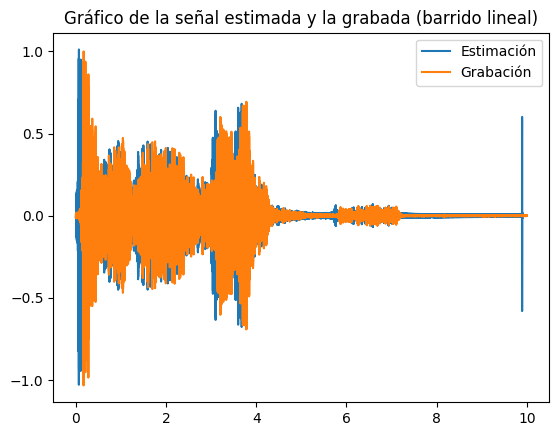

In [16]:
excitacion = ((barridoLinealOG - np.mean(barridoLinealOG))/np.max(barridoLinealOG))
grabacion = ((barridoLinealSala - np.mean(barridoLinealSala))/np.max(barridoLinealSala))

R = signal.correlate(excitacion, excitacion, mode='full')[len(excitacion)-1:]/len(excitacion)
p = signal.correlate(grabacion, excitacion, mode='full')[len(excitacion)-1:]/len(excitacion)

M = 10000

RAux = R[:M]
pAux = p[:M]
w = solve_toeplitz(RAux, pAux, check_finite=True)

estimatedSignal = signal.convolve(excitacion, w, mode='same')
t = np.linspace(0, 10, fs*10)

plt.plot(t, estimatedSignal, label='Estimación')
plt.plot(t, grabacion, label='Grabación')
plt.title('Gráfico de la señal estimada y la grabada (barrido lineal)')
plt.legend()
plt.show()


## Estimaciones de h(n)
Para la realización de las siguientes estimaciones se utiliza el M óptimo calculado en la sección anterior.


In [17]:
M = 10000

In [18]:
#Estimacion de h(n) con barrido lineal de frecuencias
excitacion = ((barridoLinealOG - np.mean(barridoLinealOG))/np.max(barridoLinealOG))
grabacion = ((barridoLinealSala - np.mean(barridoLinealSala))/np.max(barridoLinealSala))

R = signal.correlate(excitacion, excitacion, mode='full')[len(excitacion)-1:]/len(excitacion)
p = signal.correlate(grabacion, excitacion, mode='full')[len(excitacion)-1:]/len(excitacion)

RAux = R[:M]
pAux = p[:M]
wBarridoLineal = solve_toeplitz(RAux, pAux, check_finite=True)

var = np.var(grabacion)
Jo = var - pAux.dot(wBarridoLineal)
epsilonBarridoLineal = Jo/var

HBarridoLineal = np.fft.fft(wBarridoLineal)

estimatedSignal = signal.convolve(excitacion, wBarridoLineal, mode='same')
estimatedSignal = np.int16(estimatedSignal/(np.max(abs(estimatedSignal)))* 32767)

outputFilename = "prueba.wav"
wavfile.write(outputFilename, fs, estimatedSignal)

audio = Audio("prueba.wav")
display(audio)

In [19]:
#Estimacion de h(n) con barrido exponencial de frecuencias
excitacion = ((barridoExpOG - np.mean(barridoExpOG))/np.max(barridoExpOG))
grabacion = ((barridoExpSala - np.mean(barridoExpSala))/np.max(barridoExpSala))

R = signal.correlate(excitacion, excitacion, mode='full')[len(excitacion)-1:]/len(excitacion)
p = signal.correlate(grabacion, excitacion, mode='full')[len(excitacion)-1:]/len(excitacion)

RAux = R[:M]
pAux = p[:M]
wBarridoExponencial = solve_toeplitz(RAux, pAux, check_finite=True)

var = np.var(grabacion)
Jo = var - pAux.dot(wBarridoExponencial)
epsilonBarridoExponencial = Jo/var

HBarridoExponencial = np.fft.fft(wBarridoExponencial)

estimatedSignal = signal.convolve(excitacion, wBarridoExponencial, mode='same')
estimatedSignal = np.int16(estimatedSignal/(np.max(abs(estimatedSignal)))* 32767)

outputFilename = "prueba.wav"
wavfile.write(outputFilename, fs, estimatedSignal)

audio = Audio("prueba.wav")
display(audio)

In [20]:
#Estimacion de h(n) con señal de voz
excitacion = ((vozOG - np.mean(vozOG))/np.max(vozOG))
grabacion = ((vozSala - np.mean(vozSala))/np.max(vozSala))

R = signal.correlate(excitacion, excitacion, mode='full')[len(excitacion)-1:]/len(excitacion)
p = signal.correlate(grabacion, excitacion, mode='full')[len(excitacion)-1:]/len(excitacion)

RAux = R[:M]
pAux = p[:M]
wVoz = solve_toeplitz(RAux, pAux, check_finite=True)

var = np.var(grabacion)
Jo = var - pAux.dot(wVoz)
epsilonVoz = Jo/var

HVoz = np.fft.fft(wVoz)

estimatedSignal = signal.convolve(excitacion, wVoz, mode='same')
estimatedSignal = np.int16(estimatedSignal/(np.max(abs(estimatedSignal)))* 32767)

outputFilename = "prueba.wav"
wavfile.write(outputFilename, fs, estimatedSignal)

audio = Audio("prueba.wav")
display(audio)

In [21]:
#Estimacion de h(n) con señal de música
excitacion = ((musicaOG - np.mean(musicaOG))/np.max(musicaOG))
grabacion = ((musicaSala - np.mean(musicaSala))/np.max(musicaSala))

R = signal.correlate(excitacion, excitacion, mode='full')[len(excitacion)-1:]/len(excitacion)
p = signal.correlate(grabacion, excitacion, mode='full')[len(excitacion)-1:]/len(excitacion)

RAux = R[:M]
pAux = p[:M]
wMusica = solve_toeplitz(RAux, pAux, check_finite=True)

var = np.var(grabacion)
Jo = var - pAux.dot(wMusica)
epsilonMusica = Jo/var

HMusica = np.fft.fft(wMusica)

estimatedSignal = signal.convolve(excitacion, wMusica, mode='same')
estimatedSignal = np.int16(estimatedSignal/(np.max(abs(estimatedSignal)))* 32767)

outputFilename = "prueba.wav"
wavfile.write(outputFilename, fs, estimatedSignal)

audio = Audio("prueba.wav")
display(audio)

In [22]:
#Estimacion de h(n) con ruido blanco
excitacion = ((ruidoBlancoOG - np.mean(ruidoBlancoOG))/np.max(ruidoBlancoOG))
grabacion = ((ruidoBlancoSala - np.mean(ruidoBlancoSala))/np.max(ruidoBlancoSala))

R = signal.correlate(excitacion, excitacion, mode='full')[len(excitacion)-1:]/len(excitacion)
p = signal.correlate(grabacion, excitacion, mode='full')[len(excitacion)-1:]/len(excitacion)

RAux = R[:M]
pAux = p[:M]
wRuidoBlanco = solve_toeplitz(RAux, pAux, check_finite=True)

var = np.var(grabacion)
Jo = var - pAux.dot(wRuidoBlanco)
epsilonRuidoBlanco = Jo/var

HRuidoBlanco = np.fft.fft(wRuidoBlanco)

estimatedSignal = signal.convolve(excitacion, wRuidoBlanco, mode='same')
estimatedSignal = np.int16(estimatedSignal/(np.max(abs(estimatedSignal)))* 32767)

outputFilename = "prueba.wav"
wavfile.write(outputFilename, fs, estimatedSignal)

audio = Audio("prueba.wav")
display(audio)

In [23]:
from matplotlib.legend_handler import HandlerErrorbar
#Estimacion de h(n) con señal rectangular
excitacion = ((rectangularOG - np.mean(rectangularOG))/np.max(rectangularOG))
grabacion = ((rectangularSala - np.mean(rectangularSala))/np.max(rectangularSala))

R = signal.correlate(excitacion, excitacion, mode='full')[len(excitacion)-1:]/len(excitacion)
p = signal.correlate(grabacion, excitacion, mode='full')[len(excitacion)-1:]/len(excitacion)

RAux = R[:M]
pAux = p[:M]
wRectangular = solve_toeplitz(RAux, pAux, check_finite=True)

var = np.var(grabacion)
Jo = var - pAux.dot(wRectangular)
epsilonRectangular = Jo/var

HRectangular = np.fft.fft(wRectangular)

estimatedSignal = signal.convolve(excitacion, wRectangular, mode='same')
estimatedSignal = np.int16(estimatedSignal/(np.max(abs(estimatedSignal)))* 32767)

outputFilename = "prueba.wav"
wavfile.write(outputFilename, fs, estimatedSignal)

audio = Audio("prueba.wav")
display(audio)

/usr/local/lib/python3.10/dist-packages/matplotlib/cbook/__init__.py:1335: ComplexWarning: Casting complex values to real discards the imaginary part
  return np.asarray(x, float)


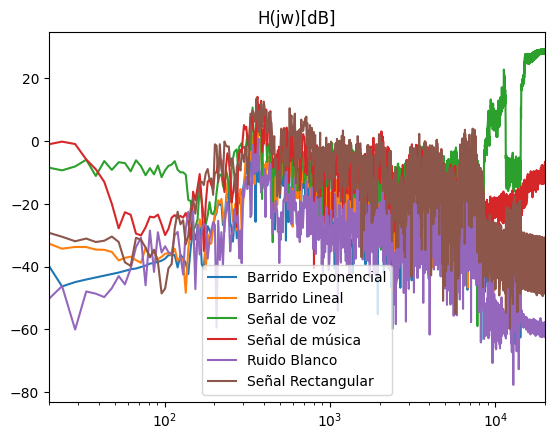

In [24]:
#Gráficos de H(jw)
frecuencias = np.fft.fftfreq(len(wBarridoLineal), 1/fs)
endIndex = int(len(frecuencias)/2)

plt.plot(frecuencias[:endIndex], 20*np.log10(HBarridoExponencial)[:endIndex], label='Barrido Exponencial')
plt.plot(frecuencias[:endIndex], 20*np.log10(HBarridoLineal)[:endIndex], label='Barrido Lineal')
plt.plot(frecuencias[:endIndex], 20*np.log10(HVoz)[:endIndex], label='Señal de voz')
plt.plot(frecuencias[:endIndex], 20*np.log10(HMusica)[:endIndex], label='Señal de música')
plt.plot(frecuencias[:endIndex], 20*np.log10(HRuidoBlanco)[:endIndex], label='Ruido Blanco')
plt.plot(frecuencias[:endIndex], 20*np.log10(HRectangular)[:endIndex], label='Señal Rectangular')
plt.title('H(jw)[dB]')
plt.xscale('log')
plt.xlim(20, 20000)
plt.legend()
plt.show()

Puede notarse que en las frecuencias centrales de este gráfico (entre 300 y 500 Hz) todas las estimaciones de H(jw) se comportan de manera similar. Esto podría deberse a que estas frecuencias son comunes en muchas señales de audio, incluyendo la voz y la música. Las mayores diferencias se encuentran en las frecuencias bajas y altas. Esto se debe a que no todas las señales poseen componentes en todo el rango de frecuencias.

Por lo tanto, las diferencias se atribuyen a que no todas las señales poseen componentes en un rango de frecuencias completo. El contenido espectral de algunas de estas señales es más limitado.El caso más limitado se dará en la rectangular de 100Hz, cuyo espectro se concentra principalmente en esa frecuencia fundamental y sus armónicos impares (300Hz, 500Hz, etc.). Esto la hace diferente de las señales de voz y música, por ejemplo, que pueden tener contenido espectral más amplio y complejo.

En el caso de la señal de voz, estas señales tienden a concentrarse en un rango relativamente estrecho de frecuencias. Como se trata de la voz de una mujer, generalmente este rango estará entre 100 Hz y 450 Hz aproximadamente, por lo que la mayor parte de la energía de esta señal estará en esta franja de frecuencias. Para el caso de la señal de música, el contenido espectral será mayor que en el caso anterior, pero aún así no abarcará todo el rango. El contenido espectral más uniforme y completo lo tendrán los barridos en frecuencia y el ruido blanco que cubren un rango de frecuencias desde una frecuencia inicial de 20 Hz hasta 20 kHz.

Siguiendo esta idea, ambos barridos en frecuencia y el ruido blanco deberían comportarse de manera similar, con diferencias debido a la naturaleza lineal o exponencial de cada uno de estos. Se analizará esto a continuación.

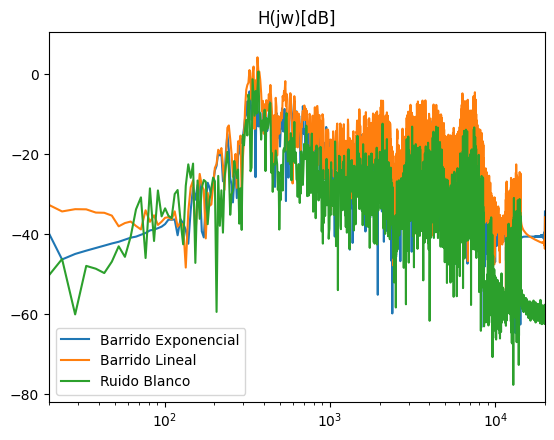

In [25]:
plt.plot(frecuencias[:endIndex], 20*np.log10(HBarridoExponencial)[:endIndex], label='Barrido Exponencial')
plt.plot(frecuencias[:endIndex], 20*np.log10(HBarridoLineal)[:endIndex], label='Barrido Lineal')
plt.plot(frecuencias[:endIndex], 20*np.log10(HRuidoBlanco)[:endIndex], label='Ruido Blanco')
plt.title('H(jw)[dB]')
plt.xscale('log')
plt.xlim(20, 20000)
plt.legend()
plt.show()

Podemos notar que todas señales graficadas se comportan de manera similar a lo largo de todo el rango.

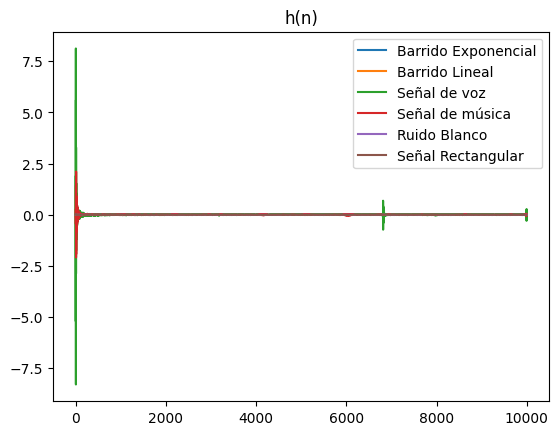

In [26]:
#Gráficos de h(n)
plt.plot(wBarridoExponencial, label='Barrido Exponencial')
plt.plot(wBarridoLineal, label='Barrido Lineal')
plt.plot(wVoz, label='Señal de voz')
plt.plot(wMusica, label='Señal de música')
plt.plot(wRuidoBlanco, label='Ruido Blanco')
plt.plot(wRectangular, label='Señal Rectangular')
plt.title('h(n)')
plt.legend()
plt.show()

In [27]:
#Cálculos de ε
print('Los valores de ε para cada excitación son:')
print('Barrido lineal de frecuencia ε =', epsilonBarridoLineal)
print('Barrido exponencial de frecuencia ε =', epsilonBarridoExponencial)
print('Señal de voz ε =', epsilonVoz)
print('Señal de música ε =', epsilonMusica)
print('Señal de ruido blanco ε =', epsilonRuidoBlanco)
print('Señal rectangular ε =', epsilonRectangular)

Los valores de ε para cada excitación son:
Barrido lineal de frecuencia ε = 0.0217161430519365
Barrido exponencial de frecuencia ε = 0.2955870072914568
Señal de voz ε = 0.2563132612727723
Señal de música ε = 0.39088196099986044
Señal de ruido blanco ε = 0.9820378430993694
Señal rectangular ε = 0.04388703250704683


Se puede ver que el ε varía para cada excitación utilizada. De los resultados obtenidos se pueden sacar las siguientes conclusiones:
*   Dado que el ε obtenido con ruido blanco se acerca mucho a 1 podemos afirmar que esta será la peor de las estimaciones.
*   Se destacan dos casos: señal rectangular y ruido blanco. Por un lado, el ruido blanco posee un buen contenido espectral ya que mantiene una potencia similar en todo el rango de frecuencias. Sin embargo, su ε fue el más alto. Por ende se deriva que no provee de un buen estimador. En el caso de la señal rectangular el ε da muy bajo, lo que es muy bueno. Pero esto no implica necesariamente que esta genere una buena estimación ya que, como se mencionó en el análisis de H(jw), su espectro de potencia es muy limitado.
*   El barrido lineal en frecuencia es el que obtiene un valor de ε más cercano a lo ideal por lo que debería proporcionar de la mejor estimación.

Comparando la predicción inicial con los resultados obtenidos, se verifica que la mejor estimación se realiza con el barrido lineal en frecuencia. Originalmente la predicción fue basada en el espectro de potencia de esta señal, el cual es amplio y abarca un mayor rango de frecuencias. Sin embargo, luego de realizar la estimación de h(n) y calcular el ε podemos ver que es el que presenta mejores resultados.

## Representación de la habitación
Como se ha mencionado previamente, el barrido lineal es el que obtuvo una mejor estimación. Siendo la excitación con un espectro de potencia amplio y con un ε muy bajo, se la considera la mejor representación de la habitación. A continuación se escucha la música estimada con el filtro y la original.

In [28]:
#Estimacion con barrido lineal
musicaEstimadaBL = signal.convolve(musicaOG, wBarridoLineal, mode='same')
musicaEstimadaBLAud = np.int16(musicaEstimadaBL/(np.max(abs(musicaEstimadaBL)))* 32767)

outputFilename = "estimacion musica con barrido lineal.wav"
wavfile.write(outputFilename, fs, musicaEstimadaBLAud)

audio = Audio("estimacion musica con barrido lineal.wav")
display(audio)

In [29]:
#Grabación Original
musicaSalaAud = np.int16(musicaSala/(np.max(abs(musicaSala)))* 32767)

outputFilename = "grabacion musica.wav"
wavfile.write(outputFilename, fs, musicaSalaAud)

audio = Audio("grabacion musica.wav")
display(audio)